In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


In [2]:
def display_image(image, vmax):
    # Display the image
    plt.imshow(image, cmap='gray', vmin=0, vmax=vmax)
    plt.colorbar()
    plt.axis('off')
    # Show the plot
    plt.show()

In [3]:
def histogram_equalization(image):
    # Calculate the histogram
    histogram, _ = np.histogram(image.flatten(), bins=2**16, range=[0, 2**16-1])
    
    # Calculate the cumulative distribution function (CDF)
    cdf = histogram.cumsum()
    
    # Normalize the CDF
    cdf_normalized = cdf / float(cdf.max())
    
    # Map the input image values to the equalized values
    equalized_image = np.interp(image.flatten(), np.arange(2**16), cdf_normalized * (2**16-1))
    
    # Reshape the equalized image to its original shape
    equalized_image = equalized_image.reshape(image.shape)
    
    # Convert the image data back to 16-bit integer type
    equalized_image = equalized_image.astype(np.uint16)
    
    return equalized_image


In [4]:
def construct_image_cube(folder_name, a, b, c, d):
    folder_path = f'../data/{folder_name}'
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.tif')]
    image_files = sorted(image_files)

    # Create an empty array to store the multispectral image cube
    image_cube = np.empty((12, ), dtype=object)

    # Loop through the image files and read the first 12 images
    count = 0
    for image_file in image_files:
        sequential_number = int(image_file.split('_')[-2])
        if 1 <= sequential_number <= 12:
            image_path = os.path.join(folder_path, image_file)
            #print(image_path)
            image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED).astype(np.float32)
            # Crop the fragment region
            image = image[a:c, b:d]
            image_cube[count] = image
            count += 1
            if count == 12:
                break

    # Stack the images in the image cube along the first dimension
    image_cube = np.stack(image_cube, axis=0)

    return image_cube


In [5]:
# Define the folders
folders = ['124-004']

# Define the a, b, c, d values
a, b, c, d = 1690, 2390, 3990, 5460

# Read the image cubes for each folder and store them in separate variables
#image_cube_124_001 = construct_image_cube('124-001', a, b, c, d)
#image_cube_124_002 = construct_image_cube('124-002', 1300, 1500, 4500, 6000)
#image_cube_198_001 = construct_image_cube('198-001', 1300, 50, 4500, 6000)
#image_cube_198_003 = construct_image_cube('198-003', a, b, c, d)
#image_cube_198_006 = construct_image_cube('198-006', a, b, c, d)
#image_cube_690_001 = construct_image_cube('690-001', a, b, c, 4500)
image_cube_124_004 = construct_image_cube('124-004', 1350, 700, 4500, 6660)

In [6]:
def save_color_image(image_cube, folder_name):

    # Load the individual band images
    blue_band = image_cube[1]
    green_band = image_cube[3]
    red_band = image_cube[5]

    # Create an empty RGB image
    bgr_image = np.zeros((red_band.shape[0], red_band.shape[1], 3), dtype=np.uint16)

    # Assign the bands to the corresponding channels
    bgr_image[:, :, 0] = blue_band
    bgr_image[:, :, 1] = green_band
    bgr_image[:, :, 2] = red_band

    # Save the color image as a 16 bit .tif file in the output folder
    output_path = os.path.join('outputs', f'{folder_name}_rgb_image.tif')
    cv2.imwrite(output_path, bgr_image)

    return


In [7]:
#save_color_image(image_cube_124_001, '124-001')
#save_color_image(image_cube_124_002, '124-002')
#save_color_image(image_cube_198_001, '198-001')
#save_color_image(image_cube_198_003, '198-003')
#save_color_image(image_cube_198_006, '198-006')
#save_color_image(image_cube_690_001, '690-001')
save_color_image(image_cube_124_004, '124-004')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


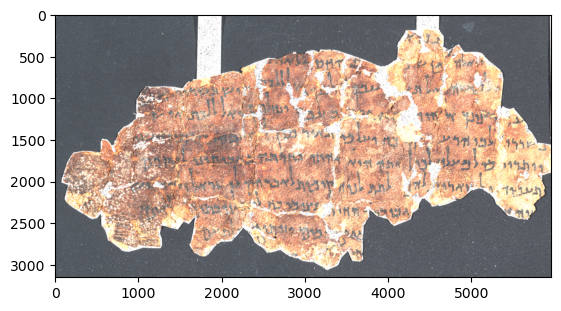

In [8]:
# Read an rgb 16bit image
bgr_image = cv2.imread('outputs/124-004_rgb_image.tif', cv2.IMREAD_UNCHANGED)
rgb_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2RGB)

plt.imshow(rgb_image)
plt.show()

In [9]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import cv2

def cluster(clustering_type, number_clusters, m, n, features, feature_type):
    num_bands = features.shape[1]

    vectors = features.reshape(-1, num_bands)

    if clustering_type == 'kmeans':
        # Perform K-means clustering
        clustering_model = KMeans(n_clusters=number_clusters, random_state=42)
    elif clustering_type == 'gaussian':
        # Perform Gaussian Mixture clustering
        clustering_model = GaussianMixture(n_components=number_clusters, random_state=42)
    else:
        raise ValueError("Invalid clustering type. Expected 'kmeans' or 'gaussian'.")

    clusters = clustering_model.fit_predict(vectors)

    # Define a set of contrastive colors
    contrastive_colors = [(255, 0, 0),    # Red
                          (0, 255, 0),    # Green
                          (0, 0, 255),    # Blue
                          (255, 255, 0),  # Yellow
                          (255, 0, 255),  # Magenta
                          (0, 255, 255),  # Cyan
                          (255, 128, 0),  # Orange
                          (153, 0, 153)]  # Murdum

    # Select colors based on the number of clusters
    cluster_colors = np.array(contrastive_colors[:number_clusters], dtype=np.uint8)

    # Count the number of pixels in each cluster
    pixel_counts = [np.sum(clusters == cluster_label) for cluster_label in np.unique(clusters)]

    # Create a colored image based on the cluster assignments
    colored_image = cluster_colors[clusters].reshape(m, n, -1)

    # Define color names corresponding to each cluster label
    color_names = {
        0: "Red",
        1: "Green",
        2: "Blue",
        3: "Yellow",
        4: "Magenta",
        5: "Cyan",
        6: "Orange",
        7: "Murdum"
    }

    # Print labels, corresponding color names, and number of pixels
    for cluster_label in np.unique(clusters):
        color_name = color_names[cluster_label]
        num_pixels = pixel_counts[cluster_label]
        print(f"Cluster {cluster_label} is assigned the color {color_name} with {num_pixels} pixels")
    
    # Save the image with cluster information
    image_name = f"outputs/{feature_type}_features_{clustering_type}_clusters_{number_clusters}.png"   
    plt.imshow(colored_image)
    plt.show()
    
    rgb_image = cv2.cvtColor(colored_image, cv2.COLOR_BGR2RGB)
    cv2.imwrite(image_name, rgb_image)
    
    return colored_image


In [10]:
import numpy as np

def extract_spectral_features(image_cube):
    m, n = image_cube.shape[1], image_cube.shape[2]
    spectral_features = np.zeros((m * n, 12), dtype=np.float32)

    for i in range(m):
        for j in range(n):
            spectral_features[i * n + j] = image_cube[:, i, j]

    return spectral_features


In [11]:
def extract_gradient_features(image_cube):
    m, n = image_cube.shape[1], image_cube.shape[2]
    gradient_features = np.zeros((m * n, 11), dtype=np.float32)

    for i in range(m):
        for j in range(n):
            for k in range(11):
                gradient_features[i * n + j, k] = image_cube[k+1, i, j] - image_cube[k, i, j]

    return gradient_features


In [12]:
def extract_special1_features(image_cube):
    m, n = image_cube.shape[1], image_cube.shape[2]
    features = np.zeros((m * n, 6), dtype=np.float32)

    for i in range(m):
        for j in range(n):
            pixel_values = image_cube[:, i, j]

            if pixel_values[0] > 300:
                pixel_values[11] = 110             
            
            f1 = pixel_values[3] - pixel_values[2]
            f2 = pixel_values[11] - pixel_values[0]
            f3 = pixel_values[10] - pixel_values[9]
            f4 = pixel_values[4] - pixel_values[0]  
            f5 = pixel_values[11]
            f6 = pixel_values[10]

            features[i * n + j] = [f1, f2, f3, f4,f5,f6]

    return features

In [13]:
def extract_special2_features(image_cube):
    m, n = image_cube.shape[1], image_cube.shape[2]
    features = np.zeros((m * n, 2), dtype=np.float32)

    for i in range(m):
        for j in range(n):
            pixel_values = image_cube[:, i, j]

            f1 = (pixel_values[11] - pixel_values[9])
            
            f2 = pixel_values[11]
                       
            features[i * n + j] = [f1, f2]

    return features

In [14]:
def extract_hole_features(image_cube):
    m, n = image_cube.shape[1], image_cube.shape[2]
    special_features = np.zeros((m * n, 1), dtype=np.float32)

    for i in range(m):
        for j in range(n):
            pixel_values = image_cube[:, i, j]
            f1 = np.sum(pixel_values[:4] < 70)  # Number of values less than 70 in the first 4 bands
            special_features[i * n + j] = f1

    return special_features


In [15]:
def extract_objects_by_color(color_codes, segmented_image):
    binary_image = np.zeros(segmented_image.shape[:2], dtype=np.uint8)

    for color_code in color_codes:
        color_mask = np.all(segmented_image == color_code, axis=2)
        binary_image[color_mask] = 255

    return binary_image

In [16]:
image_cube = image_cube_124_004
image_cube_name = '124_004'

In [17]:
spectral_features = extract_spectral_features(image_cube)

Cluster 0 is assigned the color Red with 10958884 pixels
Cluster 1 is assigned the color Green with 7815116 pixels


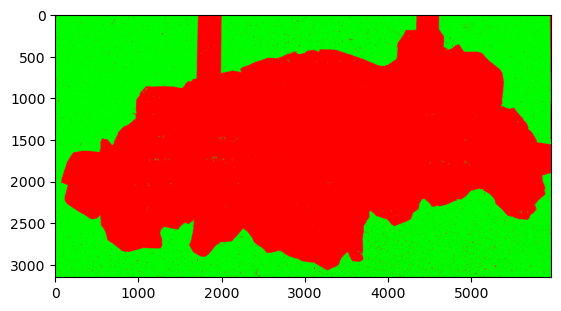

In [18]:
_ = cluster('gaussian', 2, image_cube.shape[1], image_cube.shape[2], spectral_features, 'spectral_features')

Cluster 0 is assigned the color Red with 1863082 pixels
Cluster 1 is assigned the color Green with 7775238 pixels
Cluster 2 is assigned the color Blue with 9135680 pixels


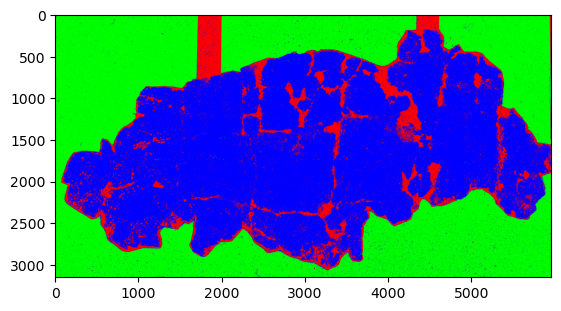

In [19]:
_ = cluster('gaussian', 3, image_cube.shape[1], image_cube.shape[2], spectral_features, 'spectral_features')

Cluster 0 is assigned the color Red with 7728699 pixels
Cluster 1 is assigned the color Green with 7534878 pixels
Cluster 2 is assigned the color Blue with 1747935 pixels
Cluster 3 is assigned the color Yellow with 1762488 pixels


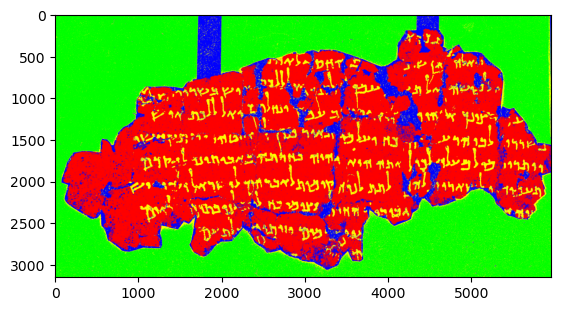

In [20]:
_ = cluster('gaussian', 4, image_cube.shape[1], image_cube.shape[2], spectral_features, 'spectral_features')

Cluster 0 is assigned the color Red with 2418901 pixels
Cluster 1 is assigned the color Green with 7527746 pixels
Cluster 2 is assigned the color Blue with 1180300 pixels
Cluster 3 is assigned the color Yellow with 5911260 pixels
Cluster 4 is assigned the color Magenta with 1735793 pixels


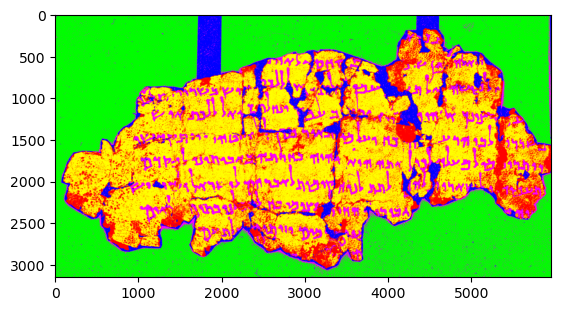

In [21]:
_ = cluster('gaussian', 5, image_cube.shape[1], image_cube.shape[2], spectral_features, 'spectral_features')

Cluster 0 is assigned the color Red with 2863599 pixels
Cluster 1 is assigned the color Green with 7498338 pixels
Cluster 2 is assigned the color Blue with 1012264 pixels
Cluster 3 is assigned the color Yellow with 5450763 pixels
Cluster 4 is assigned the color Magenta with 1656922 pixels
Cluster 5 is assigned the color Cyan with 292114 pixels


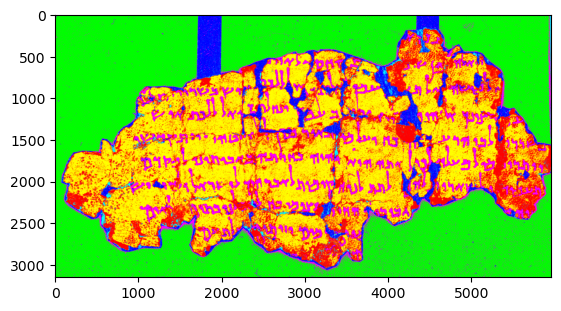

In [22]:
_ = cluster('gaussian', 6, image_cube.shape[1], image_cube.shape[2], spectral_features, 'spectral_features')

In [23]:
gradient_features = extract_gradient_features(image_cube)

Cluster 0 is assigned the color Red with 10889624 pixels
Cluster 1 is assigned the color Green with 7884376 pixels


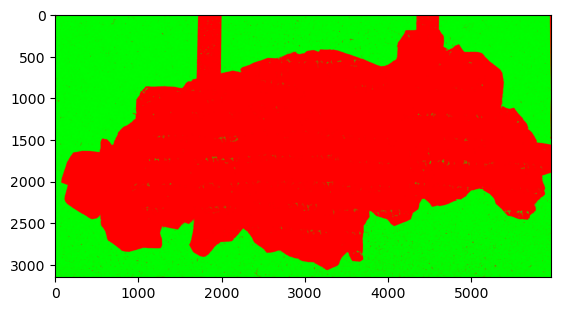

In [24]:
_ = cluster('gaussian', 2, image_cube.shape[1], image_cube.shape[2], gradient_features, 'gradient_features')

Cluster 0 is assigned the color Red with 2740331 pixels
Cluster 1 is assigned the color Green with 7839855 pixels
Cluster 2 is assigned the color Blue with 8193814 pixels


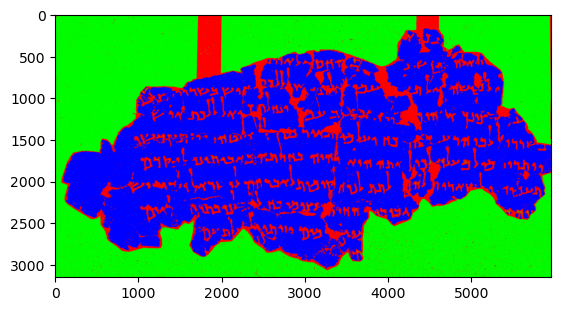

In [25]:
_ = cluster('gaussian', 3, image_cube.shape[1], image_cube.shape[2], gradient_features, 'gradient_features')

Cluster 0 is assigned the color Red with 2321906 pixels
Cluster 1 is assigned the color Green with 7827566 pixels
Cluster 2 is assigned the color Blue with 6247392 pixels
Cluster 3 is assigned the color Yellow with 2377136 pixels


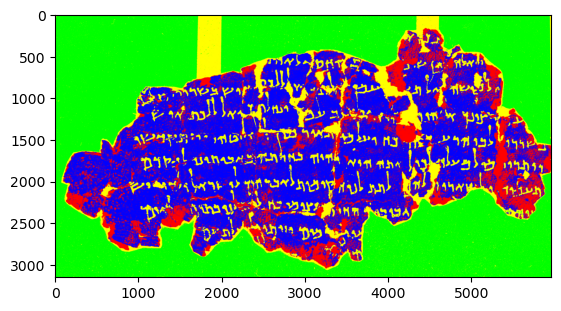

In [26]:
_ = cluster('gaussian', 4, image_cube.shape[1], image_cube.shape[2], gradient_features, 'gradient_features')

Cluster 0 is assigned the color Red with 2653711 pixels
Cluster 1 is assigned the color Green with 1106486 pixels
Cluster 2 is assigned the color Blue with 5696444 pixels
Cluster 3 is assigned the color Yellow with 1679854 pixels
Cluster 4 is assigned the color Magenta with 7637505 pixels


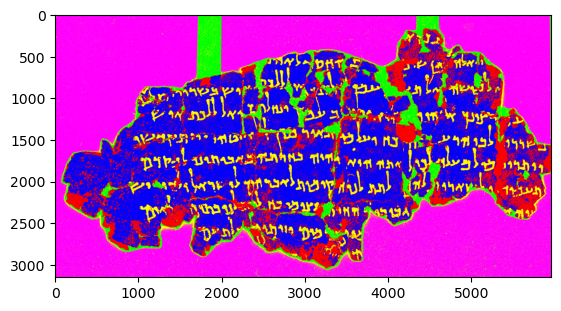

In [27]:
_ = cluster('gaussian', 5, image_cube.shape[1], image_cube.shape[2], gradient_features, 'gradient_features')

Cluster 0 is assigned the color Red with 1925141 pixels
Cluster 1 is assigned the color Green with 1515143 pixels
Cluster 2 is assigned the color Blue with 4234747 pixels
Cluster 3 is assigned the color Yellow with 2405690 pixels
Cluster 4 is assigned the color Magenta with 7576461 pixels
Cluster 5 is assigned the color Cyan with 1116818 pixels


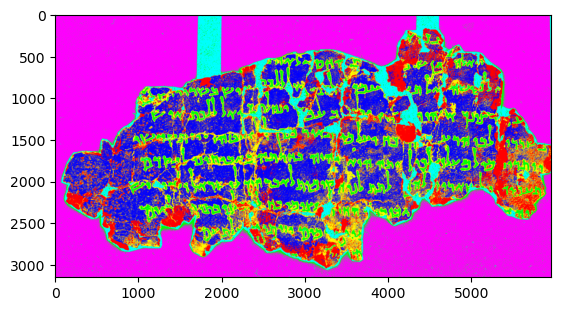

In [28]:
_ = cluster('gaussian', 6, image_cube.shape[1], image_cube.shape[2], gradient_features, 'gradient_features')

In [29]:
special1_features = extract_special1_features(image_cube)

Cluster 0 is assigned the color Red with 10020415 pixels
Cluster 1 is assigned the color Green with 8753585 pixels


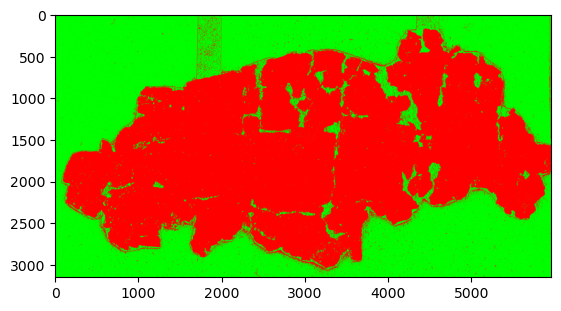

In [30]:
_ = cluster('gaussian', 2, image_cube.shape[1], image_cube.shape[2], special1_features, 'special1_features')

Cluster 0 is assigned the color Red with 9985960 pixels
Cluster 1 is assigned the color Green with 1007932 pixels
Cluster 2 is assigned the color Blue with 7780108 pixels


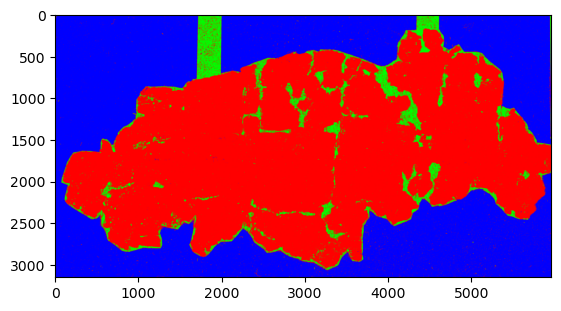

In [31]:
_ = cluster('gaussian', 3, image_cube.shape[1], image_cube.shape[2], special1_features, 'special1_features')

Cluster 0 is assigned the color Red with 3915495 pixels
Cluster 1 is assigned the color Green with 1007972 pixels
Cluster 2 is assigned the color Blue with 7745131 pixels
Cluster 3 is assigned the color Yellow with 6105402 pixels


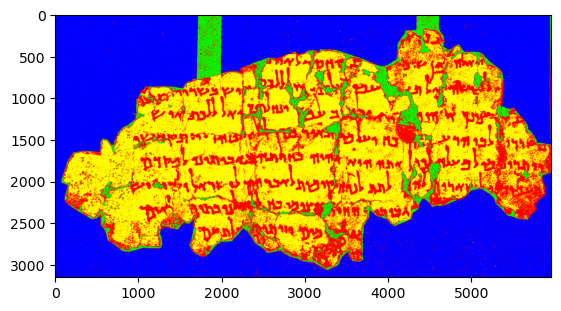

In [32]:
_ = cluster('gaussian', 4, image_cube.shape[1], image_cube.shape[2], special1_features, 'special1_features')

Cluster 0 is assigned the color Red with 3024558 pixels
Cluster 1 is assigned the color Green with 7575581 pixels
Cluster 2 is assigned the color Blue with 1724395 pixels
Cluster 3 is assigned the color Yellow with 5441319 pixels
Cluster 4 is assigned the color Magenta with 1008147 pixels


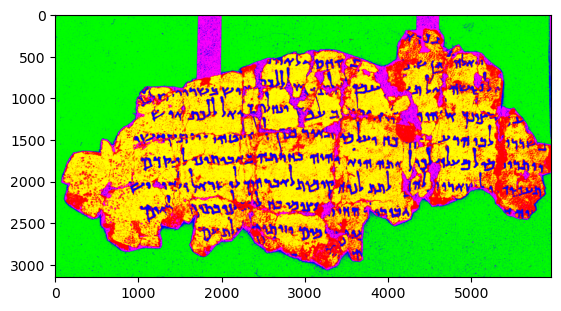

In [33]:
_ = cluster('gaussian', 5, image_cube.shape[1], image_cube.shape[2], special1_features, 'special1_features')

Cluster 0 is assigned the color Red with 2337396 pixels
Cluster 1 is assigned the color Green with 7423710 pixels
Cluster 2 is assigned the color Blue with 1534844 pixels
Cluster 3 is assigned the color Yellow with 5046742 pixels
Cluster 4 is assigned the color Magenta with 1008195 pixels
Cluster 5 is assigned the color Cyan with 1423113 pixels


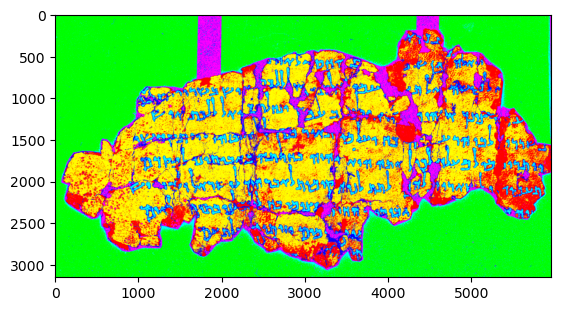

In [34]:
_ = cluster('gaussian', 6, image_cube.shape[1], image_cube.shape[2], special1_features, 'special1_features')

In [35]:
special2_features = extract_special2_features(image_cube)

Cluster 0 is assigned the color Red with 10040027 pixels
Cluster 1 is assigned the color Green with 8733973 pixels


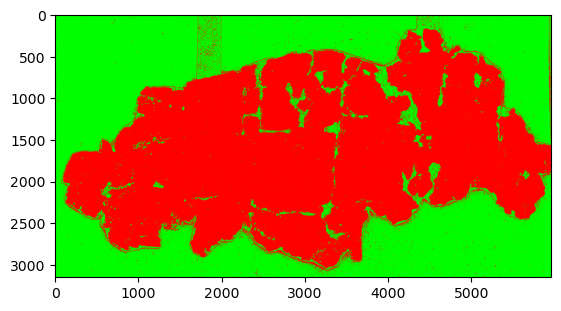

In [36]:
_ = cluster('gaussian', 2, image_cube.shape[1], image_cube.shape[2], special2_features, 'special2_features')

Cluster 0 is assigned the color Red with 9937799 pixels
Cluster 1 is assigned the color Green with 1211023 pixels
Cluster 2 is assigned the color Blue with 7625178 pixels


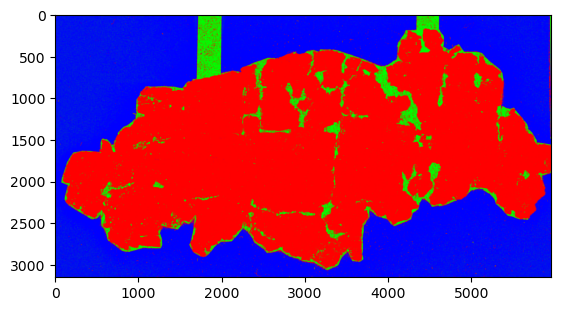

In [37]:
_ = cluster('gaussian', 3, image_cube.shape[1], image_cube.shape[2], special2_features, 'special2_features')

Cluster 0 is assigned the color Red with 8104684 pixels
Cluster 1 is assigned the color Green with 7514680 pixels
Cluster 2 is assigned the color Blue with 1943613 pixels
Cluster 3 is assigned the color Yellow with 1211023 pixels


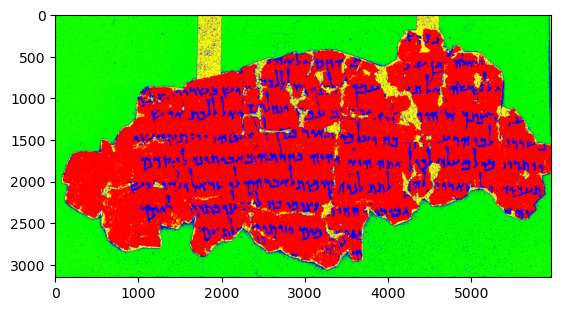

In [38]:
_ = cluster('gaussian', 4, image_cube.shape[1], image_cube.shape[2], special2_features, 'special2_features')

Cluster 0 is assigned the color Red with 1943731 pixels
Cluster 1 is assigned the color Green with 7501658 pixels
Cluster 2 is assigned the color Blue with 1788999 pixels
Cluster 3 is assigned the color Yellow with 1211023 pixels
Cluster 4 is assigned the color Magenta with 6328589 pixels


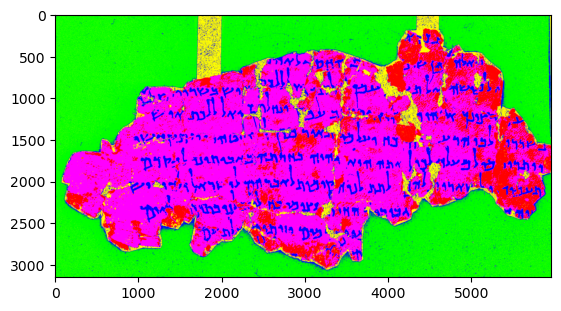

In [39]:
_ = cluster('gaussian', 5, image_cube.shape[1], image_cube.shape[2], special2_features, 'special2_features')

Cluster 0 is assigned the color Red with 1592404 pixels
Cluster 1 is assigned the color Green with 7433354 pixels
Cluster 2 is assigned the color Blue with 1670458 pixels
Cluster 3 is assigned the color Yellow with 1211023 pixels
Cluster 4 is assigned the color Magenta with 5480220 pixels
Cluster 5 is assigned the color Cyan with 1386541 pixels


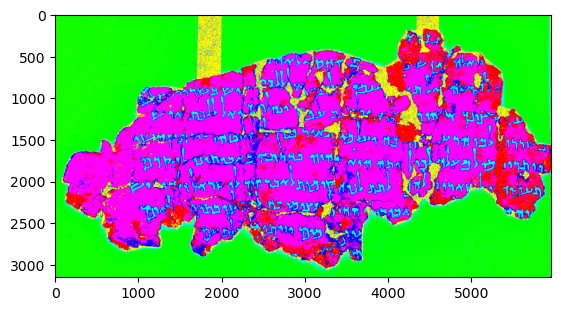

In [57]:
segments = cluster('gaussian', 6, image_cube.shape[1], image_cube.shape[2], special2_features, 'special2_features')

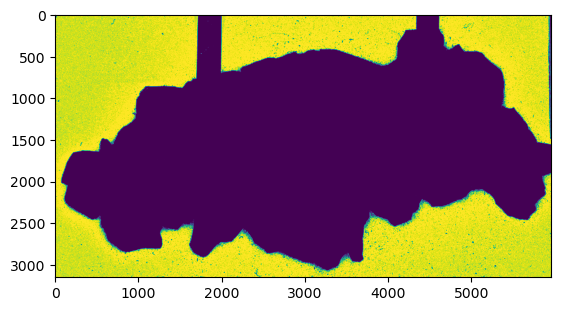

In [273]:
color_codes = [(0, 255, 0)]
back = extract_objects_by_color(color_codes, segments)
plt.imshow(back)

In [274]:
# Load the binary image
closed_back = back.copy()

# Apply connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(closed_back, connectivity=8)

for label, stat in enumerate(stats[1:], start=1):
    if stat[cv2.CC_STAT_AREA] <= 500:
        closed_back[labels == label] = 0

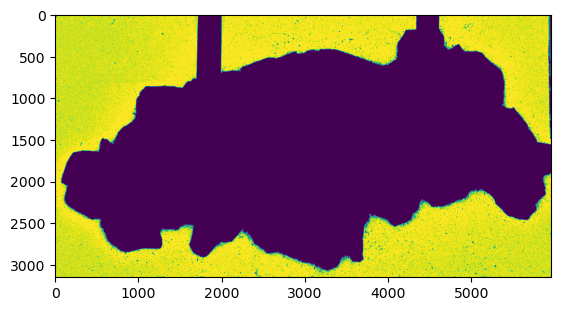

In [275]:
plt.imshow(closed_back)

In [276]:
cv2.imwrite('closed_back.png',closed_back)

True

In [278]:
filtered_back = closed_back.copy()

inverted_image = cv2.bitwise_not(filtered_back)

# Apply connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(inverted_image, connectivity=8)

# Create a mask to filter out small connected components
mask = np.zeros_like(filtered_back, dtype=np.uint8)

# Iterate through the connected components
for label, stat in enumerate(stats[1:], start=1):
    # Check if the component size is smaller than the threshold
    if stat[cv2.CC_STAT_AREA] >= 1000:
        # Add the component to the mask by setting its pixels to black
        mask[labels == label] = 255

# Apply the mask to the original binary image to remove small components
filtered_back = cv2.bitwise_or(filtered_back,cv2.bitwise_not(mask))



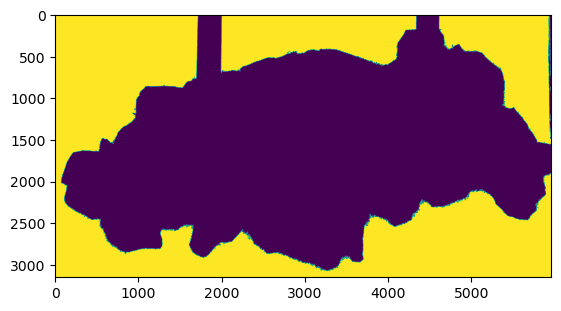

In [279]:
plt.imshow(filtered_back)

In [280]:
cv2.imwrite('filtered_back.png',filtered_back)

True

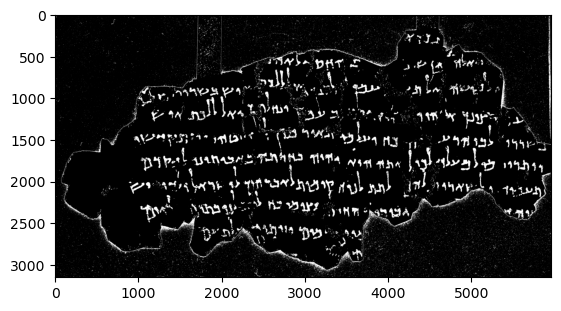

In [283]:
color_codes = [(0, 255, 255)]
ink = extract_objects_by_color(color_codes, segments)
plt.imshow(ink, cmap='gray')

In [284]:
cv2.imwrite('ink.png',ink)

True

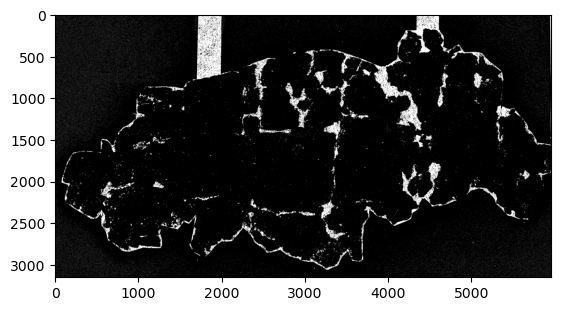

In [381]:
color_codes = [(255, 255, 0)]
rice = extract_objects_by_color(color_codes, segments)
plt.imshow(rice, cmap='gray')

In [382]:
cv2.imwrite('rice.png',rice)

True

In [383]:
back_rice = cv2.bitwise_or(filtered_back,rice)

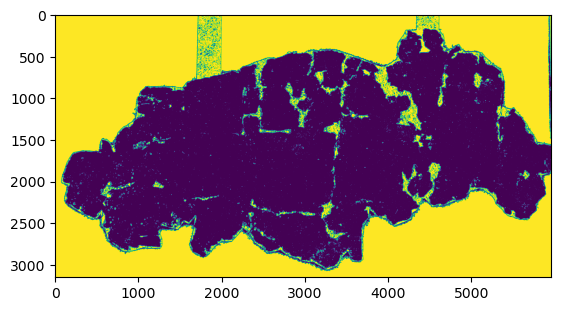

In [384]:
plt.imshow(back_rice)

In [385]:
cv2.imwrite('back_rice.png',back_rice)

True

In [386]:
filtered_back_rice = back_rice.copy()

inverted_image = cv2.bitwise_not(filtered_back_rice)

# Apply connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(inverted_image, connectivity=8)

# Create a mask to filter out small connected components
mask = np.zeros_like(filtered_back_rice, dtype=np.uint8)

# Iterate through the connected components
for label, stat in enumerate(stats[1:], start=1):
    # Check if the component size is smaller than the threshold
    if stat[cv2.CC_STAT_AREA] >= 2000:
        # Add the component to the mask by setting its pixels to black
        mask[labels == label] = 255

# Apply the mask to the original binary image to remove small components
filtered_back_rice = cv2.bitwise_or(filtered_back_rice,cv2.bitwise_not(mask))

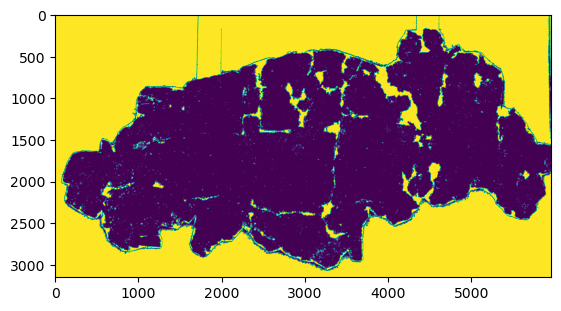

In [387]:
plt.imshow(filtered_back_rice)

In [388]:
cv2.imwrite('filtered_back_rice.png',filtered_back_rice)

True

In [389]:
closed_back_rice = filtered_back_rice.copy()

# Apply connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(closed_back_rice, connectivity=8)

# Create a mask to filter out small connected components
mask = np.zeros_like(closed_back_rice, dtype=np.uint8)

# Iterate through the connected components
for label, stat in enumerate(stats[1:], start=1):
    # Check if the component size is smaller than the threshold
    if stat[cv2.CC_STAT_AREA] <= 100:
        # Add the component to the mask by setting its pixels to black
        mask[labels == label] = 255

# Apply the mask to the original binary image to remove small components
closed_back_rice = cv2.bitwise_and(closed_back_rice,cv2.bitwise_not(mask))

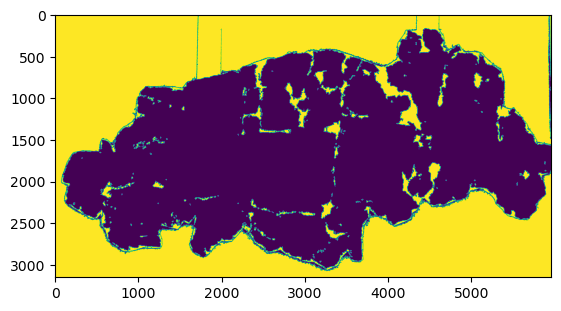

In [390]:
plt.imshow(closed_back_rice)

In [391]:
cv2.imwrite('closed_back_rice.png',closed_back_rice)

True

In [392]:
clean_ink=cv2.bitwise_and(ink, cv2.bitwise_not(closed_back_rice))

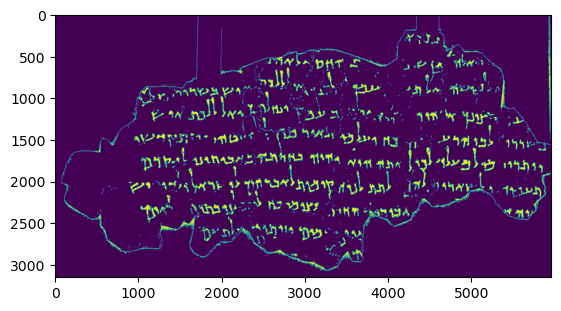

In [393]:
plt.imshow(clean_ink)

In [394]:
cv2.imwrite('clean_ink.png',clean_ink)

True

In [395]:
# Load the two binary images
mask1 = clean_ink.copy()
mask2 = closed_back_rice.copy()

kernel = np.ones((15, 15), np.uint8)
dilated_mask2 = cv2.dilate(mask2, kernel, iterations=1)

# Find the intersection between dilated_mask2 and mask1
intersection = cv2.bitwise_and(dilated_mask2, mask1)


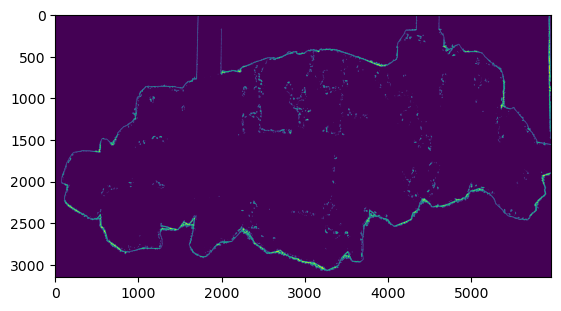

In [396]:
plt.imshow(intersection)

In [397]:
defacto_ink = clean_ink.copy()

# Find the connected components in image1
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(defacto_ink, connectivity=8)

# Iterate through the connected components
for label in range(1, num_labels):
    # Get the label of the connected component in image2
    connected_component = labels == label

    # Check if the connected component touches any white component in image2
    if np.any(np.logical_and(intersection, connected_component)):

        if np.sum(connected_component) < 500:
            defacto_ink[connected_component]=0

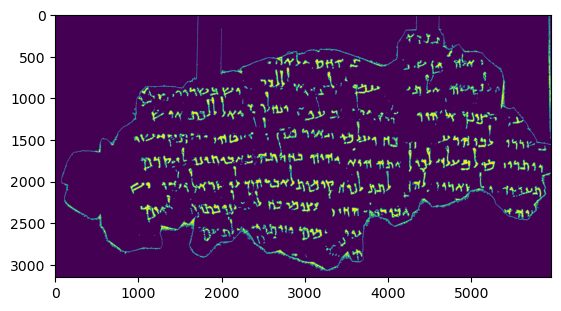

In [398]:
plt.imshow(defacto_ink)

In [399]:
cv2.imwrite('defacto_ink.png',defacto_ink)

True

In [351]:
hole_features = extract_hole_features(image_cube)

Cluster 0 is assigned the color Red with 18462939 pixels
Cluster 1 is assigned the color Green with 311061 pixels


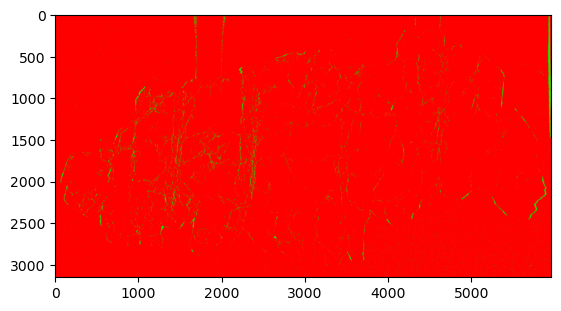

In [352]:
hole_image= cluster('gaussian', 2, image_cube.shape[1], image_cube.shape[2], hole_features, 'hole_features')

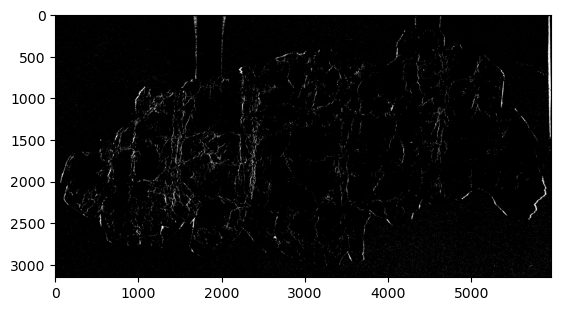

In [405]:
color_codes = [(0, 255, 0)]
hole = extract_objects_by_color(color_codes, hole_image)
plt.imshow(hole, cmap='gray')

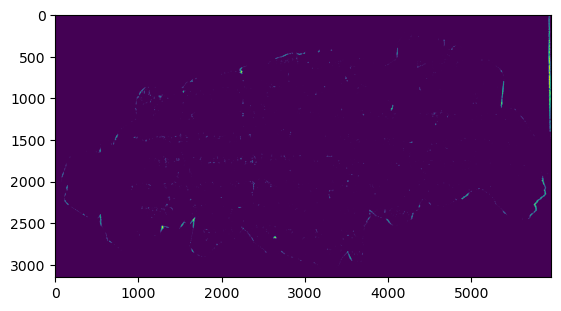

In [406]:
hole_on_ink = cv2.bitwise_and(defacto_ink, hole)
plt.imshow(hole_on_ink)

In [402]:
cv2.imwrite('hole_on_ink.png',hole_on_ink)

True

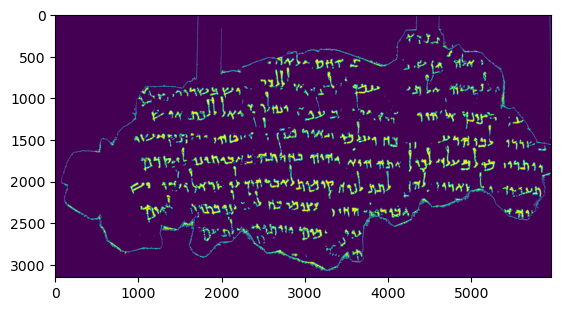

In [407]:
ink_pure = cv2.bitwise_xor(hole_on_ink, defacto_ink)
plt.imshow(ink_pure)

In [408]:
cv2.imwrite('ink_pure.png',ink_pure)

True

In [288]:
filtered_rice = rice.copy()

inverted_image = cv2.bitwise_not(filtered_rice)

# Apply connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(inverted_image, connectivity=8)

# Create a mask to filter out small connected components
mask = np.zeros_like(filtered_rice, dtype=np.uint8)

# Iterate through the connected components
for label, stat in enumerate(stats[1:], start=1):
    # Check if the component size is smaller than the threshold
    if stat[cv2.CC_STAT_AREA] >= 1000:
        # Add the component to the mask by setting its pixels to black
        mask[labels == label] = 255

# Apply the mask to the original binary image to remove small components
filtered_rice = cv2.bitwise_or(filtered_rice,cv2.bitwise_not(mask))


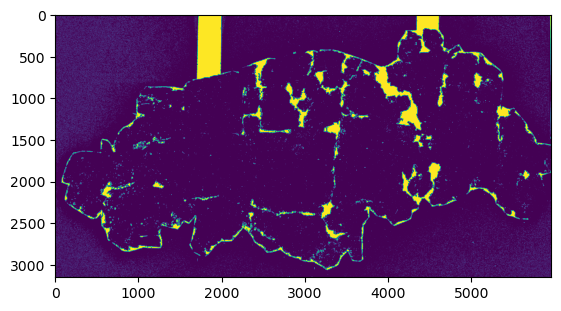

In [289]:
plt.imshow(filtered_rice)

In [290]:
cv2.imwrite('filtered_rice.png',filtered_rice)

True

In [ ]:
filtered_rice = closed_rice.copy()

inverted_image = cv2.bitwise_not(filtered_rice)

# Apply connected components analysis
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(inverted_image, connectivity=8)

# Create a mask to filter out small connected components
mask = np.zeros_like(filtered_rice, dtype=np.uint8)

# Iterate through the connected components
for label, stat in enumerate(stats[1:], start=1):
    # Check if the component size is smaller than the threshold
    if stat[cv2.CC_STAT_AREA] >= 1000:
        # Add the component to the mask by setting its pixels to black
        mask[labels == label] = 255

# Apply the mask to the original binary image to remove small components
filtered_back = cv2.bitwise_or(filtered_back,cv2.bitwise_not(mask))




In [ ]:
plt.imshow(closed_rice,cmap='gray')

In [ ]:
cv2.imwrite('closed_rice.png',closed_rice)

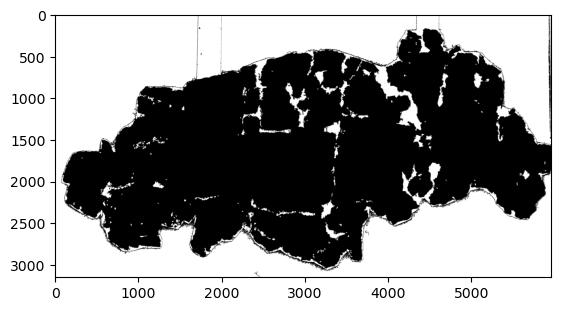

In [89]:
closed_filtered_back_rice = cv2.bitwise_or(closed_rice, closed_back)
plt.imshow(back_rice,cmap='gray')

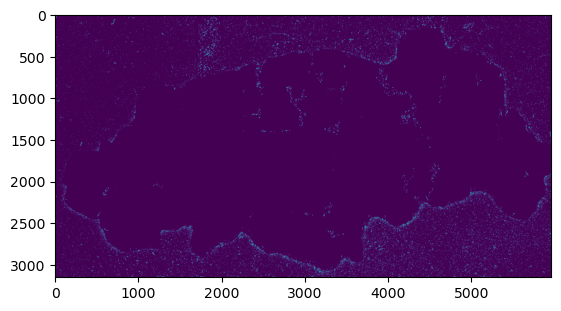

In [217]:
plt.imshow(cv2.bitwise_and(ink, back_rice))

In [220]:
# Perform bitwise AND between the binary images
mask_combined = cv2.bitwise_and(ink, back_rice)

# Apply connected components analysis to the combined mask
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask_combined, connectivity=8)

# Set a threshold for the minimum component size
min_component_size = 300


for label, stat in enumerate(stats[1:], start=1):
    if stat[cv2.CC_STAT_AREA] <= min_component_size:
        ink[labels == label] = 0


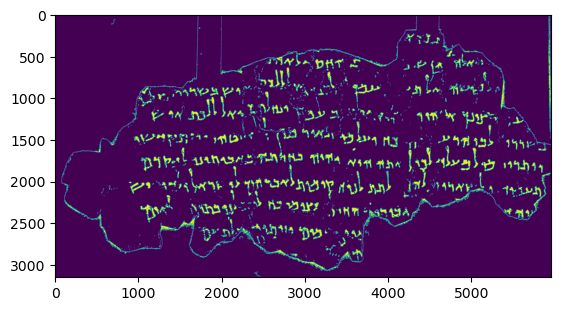

In [221]:
plt.imshow(result)

In [222]:
cv2.imwrite('result.png',result)

True

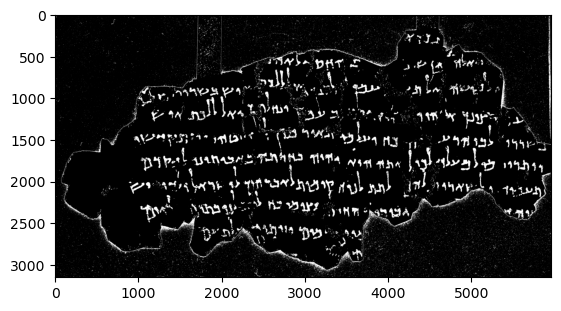

In [128]:
plt.imshow(ink)

In [223]:
import cv2
import numpy as np

# Load the two binary images
mask1 = result
mask2 = back_rice

kernel = np.ones((4, 4), np.uint8)
dilated_mask2 = cv2.dilate(mask2, kernel, iterations=1)

# Find the intersection between dilated_mask2 and mask1
intersection = cv2.bitwise_and(dilated_mask2, mask1)






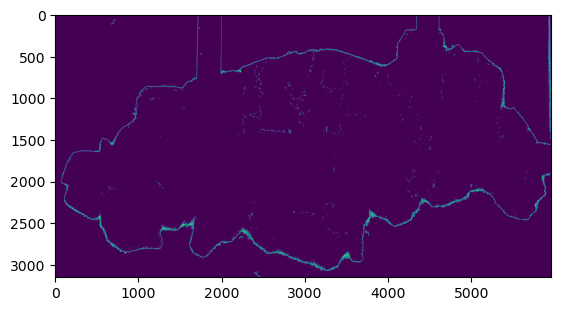

In [224]:
plt.imshow(intersection)

In [225]:
image1 = result
image2 = intersection

# Find the connected components in image1
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(image1, connectivity=8)

# Iterate through the connected components
for label in range(1, num_labels):
    # Get the label of the connected component in image2
    connected_component = labels == label

    # Check if the connected component touches any white component in image2
    if np.any(np.logical_and(image2, connected_component)):

        if np.sum(connected_component) < 300:
            image1[connected_component]=0




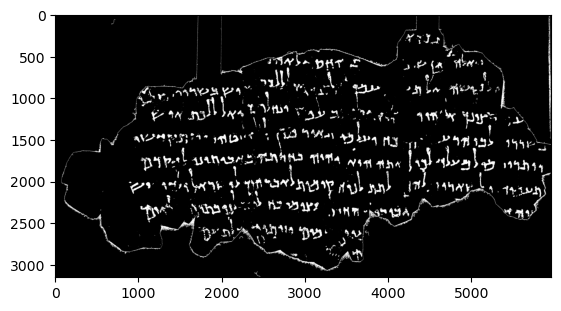

In [226]:
plt.imshow(image1, cmap='gray')

In [227]:
cv2.imwrite('image1.png',image1)

True

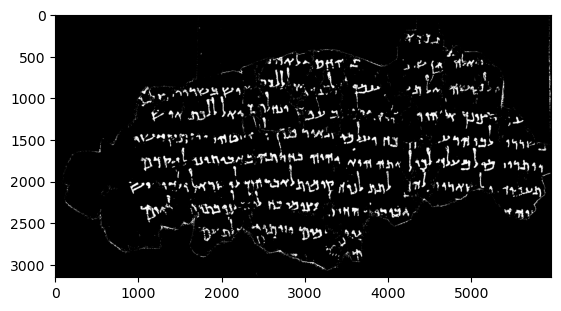

In [228]:
plt.imshow(cv2.bitwise_xor(image1,intersection),cmap='gray')

In [229]:
cv2.imwrite('final.png',cv2.bitwise_xor(image1,intersection))

True

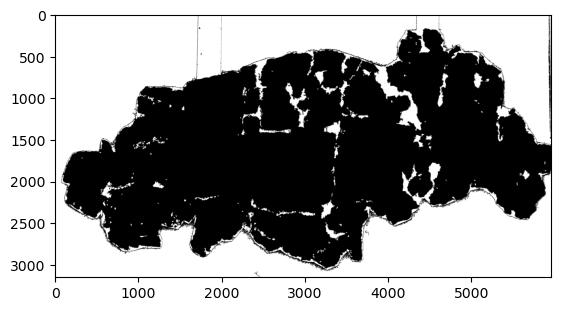

In [151]:
plt.imshow(cv2.bitwise_or(closed_rice,closed_back),cmap='gray')

In [152]:
cv2.imwrite('image1.png',cv2.bitwise_or(closed_rice,closed_back))

True

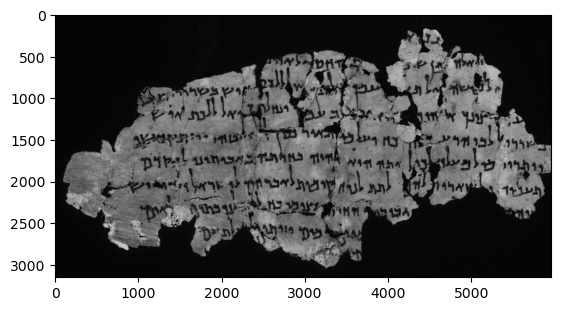

In [41]:
plt.imshow(image_cube[11],cmap='gray')

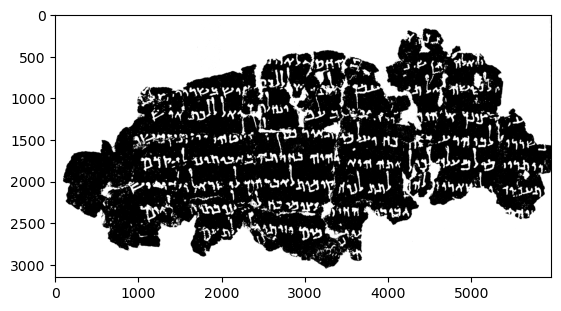

In [45]:
plt.imshow(image_cube[11]<500, cmap='gray')

In [52]:
from skimage.data import page
from skimage.filters import (threshold_otsu, threshold_niblack,
                             threshold_sauvola)



image = image_cube[11].astype(np.uint16)
binary_global = image

window_size = 89
thresh_niblack = threshold_niblack(image, window_size=window_size, k=0.8)
thresh_sauvola = threshold_sauvola(image, window_size=window_size)

binary_niblack = image > thresh_niblack
binary_sauvola = image > thresh_sauvola


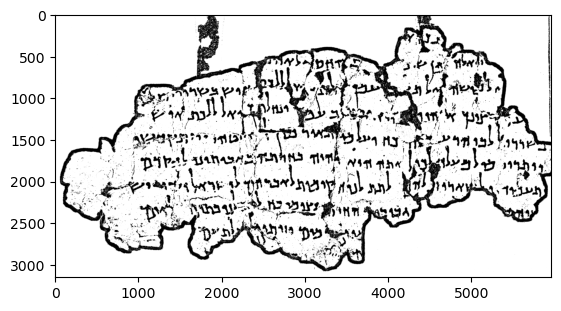

In [53]:
plt.imshow(binary_sauvola, cmap= 'gray')

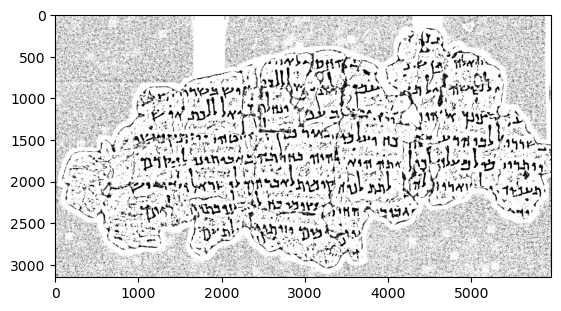

In [54]:
plt.imshow(binary_niblack, cmap= 'gray')

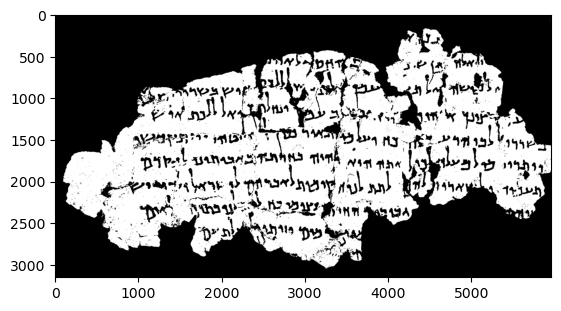

In [55]:
_, otsu = cv2.threshold(image_cube[11].astype(np.uint16), 0, 65535, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.imshow(otsu, cmap='gray')

In [56]:
cv2.imwrite('otsu.png',otsu)

True